# Sprint データセット作成

## 【問題1】自作データセットでの分類の学習

自作のデータセットに対して分類問題を解いてください。任意の実装を使用してください。

In [85]:
import numpy  as np
import os
import glob 
import re
import matplotlib.pyplot as plt
from PIL import Image
%matplotlib inline

In [5]:
!pip install tensorflow==1.15.0

In [2]:
import tensorflow as tf
print(tf.__version__)

1.15.0


### イメージの読み込み

In [86]:
path = './training' 
img_list = glob.glob(path + '/*' + ".jpg")

In [87]:
img_list

['./training/dog04.jpg',
 './training/dog05.jpg',
 './training/dog02.jpg',
 './training/dog03.jpg',
 './training/dog01.jpg',
 './training/cat03.jpg',
 './training/cat02.jpg',
 './training/cat01.jpg',
 './training/cat05.jpg',
 './training/cat04.jpg']

### イメージのロード、配列化、リサイズ、データセット作成

In [88]:
# np.resizeはだめ、ぜったい

dog_img_array = np.empty((0,224,224,3))
cat_img_array = np.empty((0,224,224,3))

for img in img_list:
    
    # ファイル名に'dog'が含まれるイメージ
    if re.search('dog', img):
        
        dog_img_ = Image.open(img)
        
        # サイズを揃える
        dog_img_ = dog_img_.resize((224, 224))
        
        # PIL.Image.Imageからnumpy配列へ
        dog_img = np.array(dog_img_)
        
        # 正規化
        dog_img = dog_img / 255.
        
        # axisの追加
        dog_img = dog_img.reshape((1,224,224,3))
        
        dog_img_array = np.concatenate([dog_img_array, dog_img], axis = 0)
    
    # ファイル名に'cat'が含まれるイメージ
    if re.search('cat', img):
        
        cat_img_ = Image.open(img)
        
        cat_img_ = cat_img_.resize((224, 224))
        
        cat_img = np.array(cat_img_)
        
        cat_img = cat_img / 255.
        
        cat_img = cat_img.reshape((1,224,224,3))
        
        cat_img_array = np.concatenate([cat_img_array, cat_img], axis = 0)

In [89]:
# print('dog_image:{}  cat_image:{}'.format(dog_img_array.shape, cat_img_array.shape))
img_array = np.concatenate([dog_img_array,cat_img_array,])

### イメージの出力

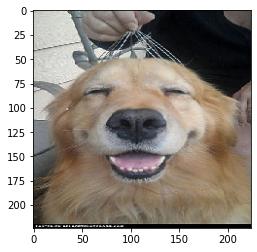

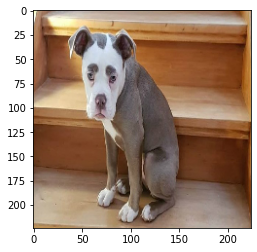

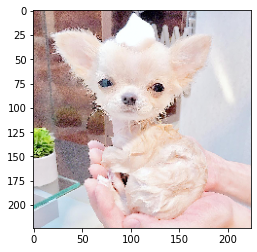

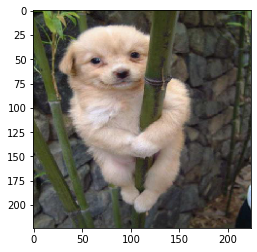

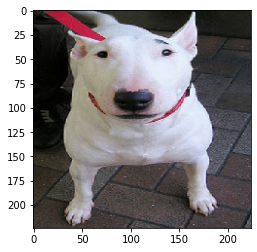

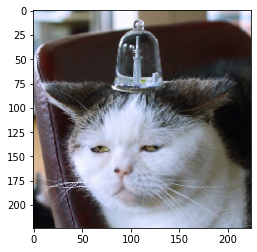

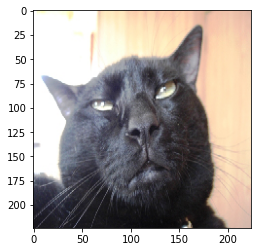

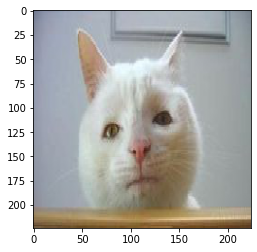

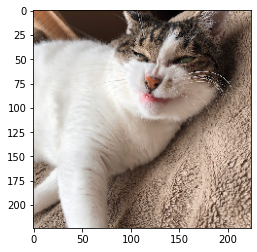

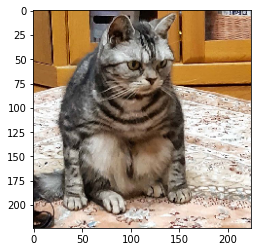

In [7]:
for i in range(len(img_array)):
    plt.imshow(img_array[i])
    plt.show()

### データの整形

In [90]:
X = img_array
y =np.array([0,0,0,0,0,1,1,1,1,1])

In [91]:
# print(X.shape)
# print(y.shape)

In [92]:
from keras.preprocessing.image import load_img,img_to_array
import keras
from sklearn.model_selection import train_test_split

# trainとvalに分割
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [93]:
# print(X_train.shape)
# print(y_train)

In [94]:
#ワンホットエンコーディング
from keras.utils import np_utils
y_train = np_utils.to_categorical(y_train)
y_test = np_utils.to_categorical(y_test)

In [95]:
# print(y_train)

### モデル作成

In [96]:
from keras.models import Sequential
from keras.layers import (Activation, Conv2D, Dense, Dropout, Flatten, MaxPooling2D)
num_classes = 2

model = Sequential()
model.add(Conv2D(32, (3, 3), padding='same', activation='relu', input_shape=(224, 224, 3)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(32, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(num_classes, activation='softmax'))

model.summary()

Instructions for updating:
If using Keras pass *_constraint arguments to layers.

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 224, 224, 32)      896       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 112, 112, 32)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 110, 110, 32)      9248      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 55, 55, 32)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 96800)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 64)                6195264   
______________________________________

In [99]:
model.compile(loss='categorical_crossentropy',
              optimizer=tf.train.AdamOptimizer(learning_rate=0.0001),
              metrics=['accuracy'])
history = model.fit(X_train, y_train,
                    batch_size=1,
                    epochs=20,
                    verbose=1)



Epoch 1/20
8/8 [==============================] - 2s 221ms/step - loss: 1.3907 - accuracy: 0.3750
Epoch 2/20
8/8 [==============================] - 1s 145ms/step - loss: 1.9567 - accuracy: 0.1250
Epoch 3/20
8/8 [==============================] - 1s 167ms/step - loss: 0.4510 - accuracy: 0.6250
Epoch 4/20
8/8 [==============================] - 1s 138ms/step - loss: 0.6055 - accuracy: 0.7500
Epoch 5/20
8/8 [==============================] - 1s 132ms/step - loss: 0.6399 - accuracy: 0.5000
Epoch 6/20
8/8 [==============================] - 1s 152ms/step - loss: 0.4567 - accuracy: 0.7500
Epoch 7/20
8/8 [==============================] - 1s 165ms/step - loss: 0.6525 - accuracy: 0.5000
Epoch 8/20
8/8 [==============================] - 1s 155ms/step - loss: 0.3528 - accuracy: 0.8750
Epoch 9/20
8/8 [==============================] - 1s 132ms/step - loss: 0.3239 - accuracy: 1.0000
Epoch 10/20
8/8 [==============================] - 1s 126ms/step - loss: 0.3084 - accuracy: 0.7500
Epoch 11/20
8/8 [

In [100]:
#推定
y_pred_proba = model.predict(X_test)[:, 0]
y_pred = np.where(y_pred_proba > 0.5, 1, 0)

print("y_pred_proba", y_pred_proba)
print("y_pred", y_pred)

y_pred_proba [0.09448513 0.2808992 ]
y_pred [0 0]


In [101]:
#評価
score = model.evaluate(X_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 1.3445332050323486
Test accuracy: 0.5


## 【問題2】分類データセットに対するデータ拡張

In [102]:
from keras.preprocessing.image import load_img, img_to_array
from keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import numpy as np
import os
import glob

# 入力ディレクトリを作成
input_dir = "./training"
files = glob.glob(input_dir + '/*.jpg')

# 出力ディレクトリを作成
output_dir = "./training_output"
if os.path.isdir(output_dir) == False:
    os.mkdir(output_dir)

for i, file in enumerate(files):

    img = load_img(file)
    x = img_to_array(img)
    x = np.expand_dims(x, axis=0)

    # ImageDataGeneratorの生成
    datagen = ImageDataGenerator(
            rescale=None,
            rotation_range=45,
            width_shift_range=0.1,
            height_shift_range=0.1,
            shear_range=0.3,
            zoom_range=0.3,
            channel_shift_range=5.,
            horizontal_flip=True
    )
    
    # prefixにラベルをつける
    prefix = ""
    if "cat" in file:
        prefix = "cat"
    elif "dog" in file:
        prefix = "dog"
    
    # 9個の画像を生成します
    g = datagen.flow(x, batch_size=1, save_to_dir=output_dir, save_prefix=prefix, save_format='jpg')
    for i in range(9):
        batch = g.next()

In [103]:
path = './training_output' 
gen_img_list = glob.glob(path + '/*' + ".jpg")
#print(gen_img_list)

In [104]:
#ファイル名でラベルを判定
y = []
for i ,file_name in  enumerate(gen_img_list):
    if "dog" in file_name:
        y.append(0)
    else:
        y.append(1)
# print(y)

In [105]:
# データの整形

dog_img_array = np.empty((0,224,224,3))
cat_img_array = np.empty((0,224,224,3))

for img in gen_img_list:
    
    # ファイル名に'dog'が含まれるイメージ
    if "dog" in img:
        
        dog_img_ = Image.open(img)
        
        # サイズを揃える
        dog_img_ = dog_img_.resize((224, 224))
        
        # PIL.Image.Imageからnumpy配列へ
        dog_img = np.array(dog_img_)
        
        # 正規化
        dog_img = dog_img / 255.
        
        # axisの追加
        dog_img = dog_img.reshape((1,224,224,3))
        
        dog_img_array = np.concatenate([dog_img_array, dog_img], axis = 0)
    
    # ファイル名に'cat'が含まれるイメージ
    if "cat" in img:
        
        cat_img_ = Image.open(img)
        
        cat_img_ = cat_img_.resize((224, 224))
        
        cat_img = np.array(cat_img_)
        
        cat_img = cat_img / 255.
        
        cat_img = cat_img.reshape((1,224,224,3))
        
        cat_img_array = np.concatenate([cat_img_array, cat_img], axis = 0)

In [106]:
aug_img_array = np.concatenate([dog_img_array,cat_img_array,])
print(aug_img_array.shape)

(180, 224, 224, 3)


In [107]:
X = aug_img_array
y = np.array(y)

print(X.shape)
print(y.shape)

(180, 224, 224, 3)
(180,)


In [108]:
aug_img_array.shape

(180, 224, 224, 3)

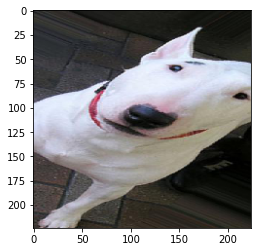

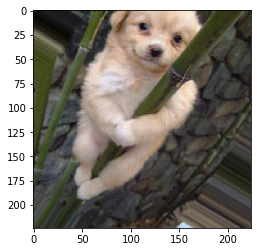

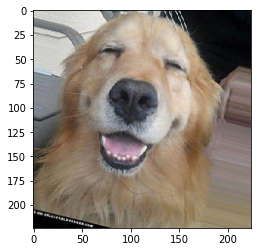

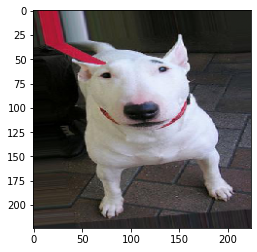

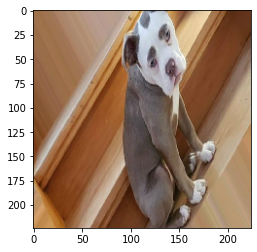

...

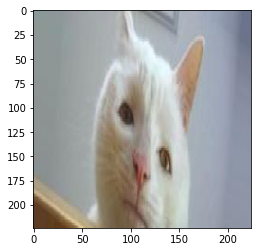

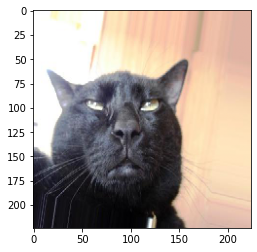

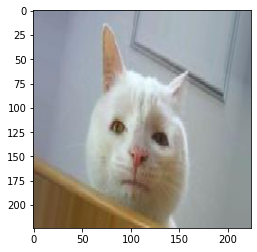

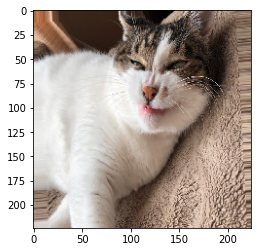

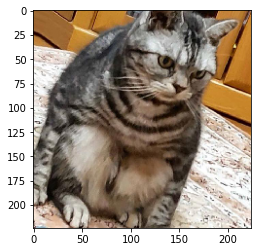

In [26]:
for i in range(len(aug_img_array)):
    plt.imshow(aug_img_array[i])
    plt.show()

In [109]:
from keras.preprocessing.image import load_img,img_to_array
import keras
from sklearn.model_selection import train_test_split

# trainとvalに分割
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [110]:
#ワンホットエンコーディング
from keras.utils import np_utils
y_train = np_utils.to_categorical(y_train)
y_test = np_utils.to_categorical(y_test)

In [112]:
# 学習
from keras.layers import (Activation, Conv2D, Dense, Dropout, Flatten, MaxPooling2D)
num_classes = 2

model = Sequential()
model.add(Conv2D(32, (3, 3), padding='same', activation='relu', input_shape=(224, 224, 3)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(32, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(num_classes, activation='softmax'))

model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 224, 224, 32)      896       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 112, 112, 32)      0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 110, 110, 32)      9248      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 55, 55, 32)        0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 96800)             0         
_________________________________________________________________
dense_3 (Dense)              (None, 64)                6195264   
_________________________________________________________________
dropout_2 (Dropout)          (None, 64)               

In [114]:
model.compile(loss='categorical_crossentropy',
              optimizer=tf.train.AdamOptimizer(learning_rate=0.0001),
              metrics=['accuracy'])
history = model.fit(X_train, y_train,
                    batch_size=1,
                    epochs=10,
                    verbose=1)

Epoch 1/10
144/144 [==============================] - 20s 137ms/step - loss: 0.6072 - accuracy: 0.6806
Epoch 2/10
144/144 [==============================] - 20s 136ms/step - loss: 0.5387 - accuracy: 0.7292
Epoch 3/10
144/144 [==============================] - 19s 130ms/step - loss: 0.4992 - accuracy: 0.7778
Epoch 4/10
144/144 [==============================] - 20s 136ms/step - loss: 0.4003 - accuracy: 0.8472
Epoch 5/10
144/144 [==============================] - 18s 127ms/step - loss: 0.3773 - accuracy: 0.8681
Epoch 6/10
144/144 [==============================] - 17s 115ms/step - loss: 0.3156 - accuracy: 0.8750
Epoch 7/10
144/144 [==============================] - 19s 132ms/step - loss: 0.2402 - accuracy: 0.9167
Epoch 8/10
144/144 [==============================] - 17s 115ms/step - loss: 0.1977 - accuracy: 0.9653
Epoch 9/10
144/144 [==============================] - 25s 171ms/step - loss: 0.1929 - accuracy: 0.9444
Epoch 10/10
144/144 [==============================] - 48s 332ms/step - l

In [115]:
#推定
y_pred_proba = model.predict(X_test)[:, 0]
y_pred = np.where(y_pred_proba > 0.5, 1, 0)

print("y_pred_proba", y_pred_proba)
print("y_pred", y_pred)

y_pred_proba [0.14420038 0.37612435 0.48599344 0.26790047 0.2785463  0.49219757
 0.68151116 0.04950517 0.9633572  0.26154748 0.6039051  0.773324
 0.768142   0.47207308 0.29068077 0.4988121  0.19108233 0.4652339
 0.08923954 0.6360536  0.26586226 0.16075917 0.51038694 0.19112603
 0.94605964 0.2994506  0.0621966  0.28180563 0.82030636 0.18797052
 0.04717451 0.20312001 0.64804214 0.7786996  0.37528053 0.70732725]
y_pred [0 0 0 0 0 0 1 0 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 1 0 0 0 1 1 0 1]


In [116]:
#評価
score = model.evaluate(X_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 0.7971267369058397
Test accuracy: 0.6111111044883728


## 【問題3】物体検出データセットの用意
次に、物体検出を行います。バウンディングボックスのアノテーションを行い物体検出のためのデータセットを作成してください。

- labelImgを使用してデータを作成

In [14]:
#XMLデータの必要情報を抜き出す
annotation = []
for i in range(5):
  tmp = []
  filepath = "dog_10"+str(i)+".xml"
  tree = ET.parse(filepath)
  root = tree.getroot()
  tmp.append(root[2].text)
  tmp.append(root[6][4][0].text)  #xmin
  tmp.append(root[6][4][1].text)  #ymin
  tmp.append(root[6][4][2].text)  #xmax
  tmp.append(root[6][4][3].text)  #ymax
  annotation.append(tmp)

In [22]:
for i in annotation:
  print(i)

['/Users/kojiyakubo/_DIC/diveintocode-ml/labelImg/img/dog04.jpg', '8', '102', '296', '449', '449', 'dog']
['/Users/kojiyakubo/_DIC/diveintocode-ml/labelImg/img/dog05.jpg', '115', '33', '480', '440', '440', 'dog']
['/Users/kojiyakubo/_DIC/diveintocode-ml/labelImg/img/dog02.jpg', '63', '82', '893', '1046', '1046', 'dog']
['/Users/kojiyakubo/_DIC/diveintocode-ml/labelImg/img/dog03.jpg', '48', '36', '292', '499', '499', 'dog']
['/Users/kojiyakubo/_DIC/diveintocode-ml/labelImg/img/dog01.jpg', '38', '1', '256', '451', '451', 'dog']
['/Users/kojiyakubo/_DIC/diveintocode-ml/labelImg/img/cat03.jpg', '15', '155', '500', '498', '498', 'cat']
['/Users/kojiyakubo/_DIC/diveintocode-ml/labelImg/img/cat02.jpg', '1', '21', '374', '336', '336', 'cat']
['/Users/kojiyakubo/_DIC/diveintocode-ml/labelImg/img/cat01.jpg', '47', '11', '182', '127', '127', 'cat']
['/Users/kojiyakubo/_DIC/diveintocode-ml/labelImg/img/cat05.jpg', '1', '1', '701', '800', '800', 'cat']
['/Users/kojiyakubo/_DIC/diveintocode-ml/label

## 【問題4】物体検出データセットに対するデータ拡張
データ拡張（Data Augmentation）を行ってください。前述のalbumentationsはバウンディングボックスを合わせての加工が可能です。詳細はREADME.mdを確認してください。

In [35]:
pip install -U git+https://github.com/albumentations-team/albumentations

  Cloning https://github.com/albumentations-team/albumentations to /private/var/folders/rv/17t8_p497nzdmvvnkllx_hj80000gn/T/pip-req-build-6wf_w7dz
  Running command git clone -q https://github.com/albumentations-team/albumentations /private/var/folders/rv/17t8_p497nzdmvvnkllx_hj80000gn/T/pip-req-build-6wf_w7dz
  Using cached imgaug-0.4.0-py2.py3-none-any.whl (948 kB)
  Created wheel for albumentations: filename=albumentations-0.4.6-py3-none-any.whl size=65434 sha256=78927800557d56c0fa5e79e08459c9cb12604ccbf70d175cecac36c279695414
  Stored in directory: /private/var/folders/rv/17t8_p497nzdmvvnkllx_hj80000gn/T/pip-ephem-wheel-cache-_ad1xdmo/wheels/3a/25/ed/ec3b518e7a332d7f0a3bb37c280e1b784cf2f79b94b3c7d00b
Successfully built albumentations
  Attempting uninstall: imgaug
    Found existing installation: imgaug 0.2.6
    Uninstalling imgaug-0.2.6:
      Successfully uninstalled imgaug-0.2.6
  Attempting uninstall: albumentations
    Found existing installation: albumentations 0.4.5
    Uni

In [71]:
%matplotlib inline
import os
import numpy as np
import cv2
from matplotlib import pyplot as plt

from albumentations import (
    HorizontalFlip,
    VerticalFlip,
    Resize,
    CenterCrop,
    RandomCrop,
    Crop,
    Compose,
    Transpose
)

In [37]:
def load_image(path):
    image = cv2.imread(path)
    im_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return im_rgb

In [38]:
BOX_COLOR = (255, 0, 0)
TEXT_COLOR = (255, 255, 255)

def visualize_bbox(img, bbox, class_id, class_idx_to_name, color=BOX_COLOR, thickness=2):
    x_min, y_min, x_max, y_max = bbox
    x_min, y_min, x_max, y_max = int(x_min), int(y_min), int(x_max), int(y_max)
    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)
    class_name = class_idx_to_name[class_id]
    ((text_width, text_height), _) = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SIMPLEX, 0.35, 1)    
    cv2.rectangle(img, (x_min, y_min - int(1.3 * text_height)), (x_min + text_width, y_min), BOX_COLOR, -1)
    cv2.putText(img, class_name, (x_min, y_min - int(0.3 * text_height)), cv2.FONT_HERSHEY_SIMPLEX, 0.35,TEXT_COLOR, lineType=cv2.LINE_AA)
    return img

def visualize(annotations, category_id_to_name):
    img = annotations['image'].copy()
    for idx, bbox in enumerate(annotations['bboxes']):
        img = visualize_bbox(img, bbox, annotations['category_id'][idx], category_id_to_name)
    plt.figure(figsize=(12, 12))
    plt.imshow(img)

In [39]:
import numpy as np
import xml.etree.ElementTree as ET

def xml2loc(path, name_to_label_id):
    file = open(path)
    tree = ET.parse(file)
    root = tree.getroot()
    box_list = []
    label_list = []
    
    for obj in root.iter('object'):
        label_name = obj.find('name').text
        label_id = int(name_to_label_id[label_name])
        label_list.append(label_id)
        
        xmlbox = obj.find('bndbox')
        box = [int(xmlbox.find('xmin').text), int(xmlbox.find('ymin').text), int(xmlbox.find('xmax').text), int(xmlbox.find('ymax').text)]
        box_list.append(box)
    
    return box_list, label_list

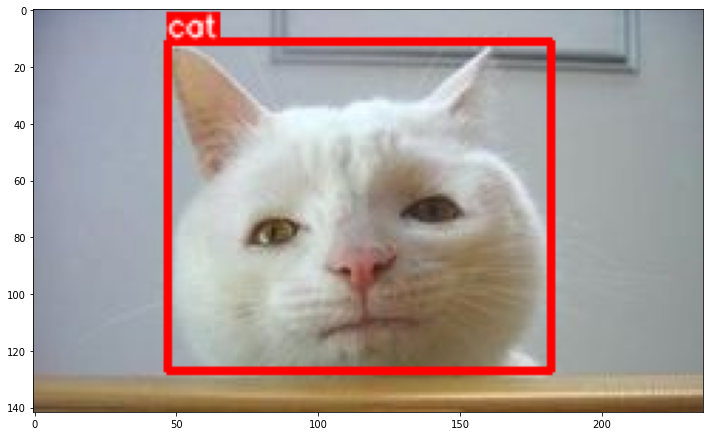

In [55]:
image = load_image('./img/cat01.jpg')
path = './xml/cat01.xml'
name_to_label_id = {'cat': 0, 'dog': 1}
box_list, label_list = xml2loc(path, name_to_label_id)

annotations = {'image': image, 'bboxes': box_list, 'category_id': label_list}
category_id_to_name = {0: 'cat', 1: 'dog'}
visualize(annotations, category_id_to_name)

In [76]:
def get_aug(aug, min_area=0., min_visibility=0.):
    return Compose(aug, bbox_params={
        'format': 'pascal_voc', 
        'min_area': min_area, 
        'min_visibility': min_visibility, 
        'label_fields': ['category_id']})

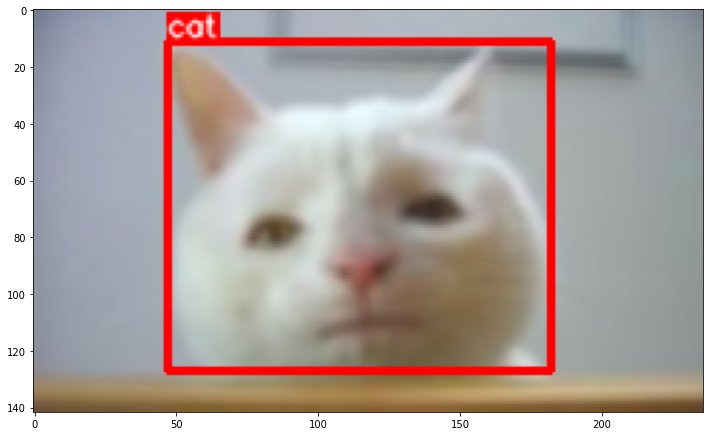

In [79]:
# Blur
aug = get_aug([Blur(p=1)])
augmented = aug(**annotations)
visualize(augmented, category_id_to_name)

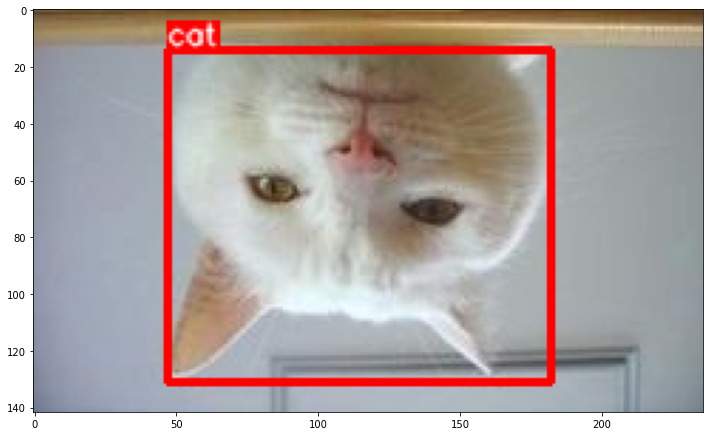

In [117]:
# VerticalFlip
aug = get_aug([VerticalFlip(p=1)])
augmented = aug(**annotations)
visualize(augmented, category_id_to_name)

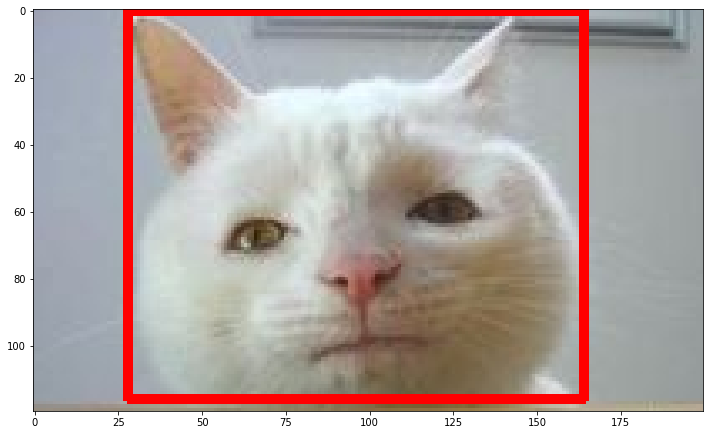

In [68]:
# CenterCrop
aug = get_aug([CenterCrop(p=1, height=120, width=200)])
augmented = aug(**annotations)
visualize(augmented, category_id_to_name)